<h2 style="text-align:center;font-size:200%;">
    <b>Deep Learning Model Training for gelose plate counting prediction</b>
</h2>
<h3  style="text-align:center;">Keywords : 
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Deep Learning</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">YOLOv5</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Pytorch</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Gelose plate</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Microbiology</span>
</h3>


The purpose of this notebook is to train a Deep Learning model to identify bacterial colonies on a culture agar image. Once the colonies are detected, it is then possible to count them, saving valuable time thanks to this automation.

This work is based on the following scientific article, published in *Nature - Scientific Data*:

Annotated dataset for deep-learning-based bacterial colony detection
*Makrai, L., Fodróczy, B., Nagy, S.Á. et al. Annotated dataset for deep-learning-based bacterial colony detection. 
Sci Data 10, 497 (2023). https://doi.org/10.1038/s41597-023-02404-8*

# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">1. Import packages and dependancies</div>

In [1]:
# Generic libraries
import numpy as np
import pandas as pd
import os
import sys
import random
import shutil
import yaml
from pathlib import Path, PosixPath

# Image processing libraries
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import seaborn as sns

# Pytorch & ML/DL libraries
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

C:\Users\Arnaud\AppData\Roaming\Python\Python312\site-packages\onnxruntime\capi\onnxruntime_validation.py:26: UserWarning: Unsupported Windows version (11). ONNX Runtime supports Windows 10 and above, only.
  warnings.warn(


In [2]:
# draw matplotlib figures in jupyter notebooks
%matplotlib inline

In [43]:
# Define the root directory
current_dir = Path.cwd()
data_dir = current_dir.parent / 'data'
models_dir = current_dir.parent / 'models'
notebooks_dir = current_dir.parent / 'notebooks'
yolo_dir = current_dir.parent / 'yolov5'

# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">2. Data preparation</div>

### 2.1. Data loading

Le jeu de données se trouve à l'adresse suivante [Annotated dataset for deep-learning-based bacterial colony detection](https://figshare.com/articles/dataset/Annotated_dataset_for_deep-learning-based_bacterial_colony_detection/22022540/3) et a été téléchargé dans sa version n°3.

The dataset used for training the model consists of 369 images of Petri dishes, some with bacterial colonies and some without. Alongside these raw images, a data table contains the locations of the colonies identified on the various images. This location, in the form of a rectangle, is defined using the parameters bbox_x, bbox_y, bbox_width, and bbox_height, which correspond to the x and y coordinates, as well as the width and height of the boxes, respectively. By cross-referencing the two pieces of information—the raw image and the annotated coordinates—it is possible to reconstruct the complete image. The images are saved in PNG format and have a size of 3001x2960 pixels.

Methodologically, this can be followed by culture procedures, which primarily involve determining the number of bacterial colony-forming units on solid culture media, visible to the naked eye. However, this is a time-consuming and laborious professional activity. To address the automation of colony-forming unit counting using convolutional neural networks in our work, we have cultured 24 bacterial species of veterinary importance with different concentrations on solid media. A total of 56,865 colonies were manually annotated with bounding boxes on 369 digital images of bacterial cultures.

In [15]:
# Load annotation ".csv" file
df = pd.read_csv(str(data_dir / 'annot_tab.csv'))
df.head()

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
0,sp01,1316,1600,145,115,sp01_img01.jpg,3001,2960
1,sp01,2601,1970,150,116,sp01_img01.jpg,3001,2960
2,sp01,2032,908,131,145,sp01_img01.jpg,3001,2960
3,sp01,1133,532,150,156,sp01_img01.jpg,3001,2960
4,sp01,1112,501,145,120,sp01_img02.jpg,2894,2890


In [17]:
# Load bacteria & media metadata
df_bacteria = pd.read_csv(str(data_dir / 'bacteria_data.csv'), sep=';')
df_bacteria.columns = ['Bacteria species', 'image_name_short', 'Gram', 'Culturing', 'Agar', 'Required_NAD', 'Required_CO2']
df_bacteria.head()

,Bacteria species,image_name_short,Gram,Culturing,Agar,Required_NAD,Required_CO2
0,Actinobacillus equuli,sp01,-,aerobic,blood,-,+
1,Actinobacillus pleuropneumoniae,sp02,-,aerobic,chocolate,-,+
2,Aeromonas hydrophila,sp03,-,aerobic,blood,-,-
3,Bacillus cereus,sp04,+,aerobic,blood,-,-
4,Bibersteinia trehalosi,sp05,-,aerobic,blood,-,-


In [18]:
# Regroup the number of colonies per image and save it to a new ".csv" file
counting_results = df.groupby("image_name").size().reset_index(name='colonies_count')
counting_results.to_csv("counting_results.csv", index=False)
counting_results.head() 

,image_name,colonies_count
0,sp01_img01.jpg,4
1,sp01_img02.jpg,4
2,sp01_img03.jpg,5
3,sp01_img04.jpg,5
4,sp01_img05.jpg,10


### 2.2. Data prepraration & split

Performing a train-test split is essential in deep learning to evaluate the model's performance on unseen data, ensuring it generalizes well beyond the training set. This practice helps prevent overfitting by allowing the detection of discrepancies between the model's accuracy on training and test datasets.
Originally, when downloading the dataset, all the images are located in a single folder. We will therefore separate them randomly to create a training set and a validation set, which will be used to evaluate the performance of our model.

In [19]:
random.seed(21)
train_test_ratio = 0.2
images_list = df['image_name'].unique().tolist()

# Randomized Manual train / test split for picture
num_elements_to_move = int(len(images_list) * train_test_ratio)
elements_to_move = random.sample(images_list, num_elements_to_move)
images_list_test = elements_to_move
images_list_train = [element for element in images_list if element not in elements_to_move]

# Randomized Manual train / test split for annotations and dataframes
train_df = df[df['image_name'].isin(images_list_train)]
val_df = df[df['image_name'].isin(images_list_test)]

In [20]:
# Verification of the split
print('Number of UFCs in the train set: {}'.format(train_df.shape[0]))
print('Number of UFCs in the test set: {}'.format(val_df.shape[0]))

Number of UFCs in the train set: 47106
Number of UFCs in the test set: 9759


Then we can create the folders organisation corresponding to the previous split:

In [21]:
# Folder paths creation
base_path = '../data'
train_image_dir = os.path.join(base_path, 'images/train')
val_image_dir = os.path.join(base_path, 'images/val')
train_label_dir = os.path.join(base_path, 'labels/train')
val_label_dir = os.path.join(base_path, 'labels/val')
os.makedirs(train_image_dir, exist_ok=True)
os.makedirs(val_image_dir, exist_ok=True)
os.makedirs(train_label_dir, exist_ok=True)
os.makedirs(val_label_dir, exist_ok=True)

Then, we will move the images and annotations to the corresponding folders using the 2 following functions:

In [23]:
def convert_bbox_format(row, image_width, image_height):
    """
    Convert bounding box annotations to YOLO format.

    YOLO format expects bounding boxes in the format:
    class_id, x_center, y_center, width, height
    where:
    - x_center and y_center are the normalized coordinates of the center of the bounding box.
    - width and height are normalized to the dimensions of the image.

    Parameters:
    row (dict): A dictionary containing bounding box details with keys 'bbox_x', 'bbox_y', 
                'bbox_width', and 'bbox_height'.
    image_width (int): The width of the image.
    image_height (int): The height of the image.

    Returns:
    list: A list containing class_id (0 for this example), x_center, y_center, width, and height 
          in YOLO format.
    """
    # Calculate the normalized center coordinates of the bounding box
    x_center = (row['bbox_x'] + row['bbox_width'] / 2) / image_width
    y_center = (row['bbox_y'] + row['bbox_height'] / 2) / image_height
    
    # Calculate the normalized width and height of the bounding box
    bbox_width = row['bbox_width'] / image_width
    bbox_height = row['bbox_height'] / image_height
    
    # Return the bounding box in YOLO format
    return [0, x_center, y_center, bbox_width, bbox_height]

In [24]:
def save_annotations_and_images(df, image_dir, label_dir, base_path):
    """
    Save image annotations in YOLO format and copy corresponding images to a specified directory.

    This function iterates over a DataFrame containing image names and bounding box annotations, 
    converting the bounding boxes to YOLO format and saving them as .txt files. It also copies 
    the images to a specified directory.

    Parameters:
    df (DataFrame): Pandas DataFrame containing the following columns:
                    - 'image_name': Name of the image file.
                    - 'bbox_x', 'bbox_y', 'bbox_width', 'bbox_height': Bounding box coordinates.
                    - 'image_width', 'image_height': Dimensions of the image.
    image_dir (str): Path to the directory where images will be copied.
    label_dir (str): Path to the directory where label files will be saved.
    base_path (str): Base directory path where original images are located.

    Returns:
    None
    """
    # Iterate over unique image names in the DataFrame
    for image_name in df['image_name'].unique():
        # Define paths for the source image and the destination image copy
        image_path = os.path.join(base_path, 'images_CFU', image_name)
        subset_image_path = os.path.join(image_dir, image_name)
        
        # Copy the image to the target directory
        shutil.copy(image_path, subset_image_path)
        
        # Filter the DataFrame to get annotations for the current image
        annotations = df[df['image_name'] == image_name]
        
        # Define the path for the label file
        label_path = os.path.join(label_dir, image_name.replace('.jpg', '.txt'))
        
        # Write the YOLO format annotations to the label file
        with open(label_path, 'w') as f:
            for idx, row in annotations.iterrows():
                # Convert the bounding box format to YOLO format
                bbox = convert_bbox_format(row, row['image_width'], row['image_height'])
                
                # Write the converted bounding box to the file
                f.write(' '.join(map(str, bbox)) + '\n')


In [25]:
%%time
# Save the annotations and images for the train set
save_annotations_and_images(train_df, train_image_dir, train_label_dir, '../data/')

CPU times: total: 1.67 s
Wall time: 1.88 s


In [26]:
%%time
# Save the annotations and images for the test/validation set
save_annotations_and_images(val_df, val_image_dir, val_label_dir, '../data/')

CPU times: total: 312 ms
Wall time: 326 ms


# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">3. Data Visualization</div>

### 3.1 First visualisation of sample images and annotations

In [27]:
df_coord = df[['image_name', 'bbox_x', 'bbox_y', 'bbox_width', 'bbox_height']]

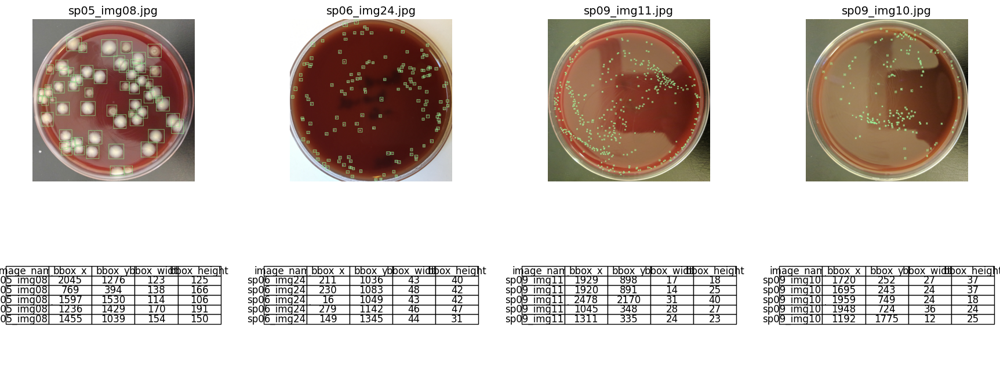

In [28]:
# Select randomly 4 pictures in the dataset with the associated annotated colonies
size = 4
max_rows = 5

fig, axes = plt.subplots(2, 4, figsize=(22, 8))

# Main loop to manage subplots
for i in range(size):
    # Load random image
    image_to_display = random.choice(list(df['image_name'].unique()))
    filtered_df = df_coord[df_coord['image_name'] == image_to_display]
    # image = cv2.imread(f'../data/images_CFU/{image_to_display}')
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image = Image.open(f'../data/images_CFU/{image_to_display}')
    draw = ImageDraw.Draw(image)
    for idx, row in filtered_df.iterrows():
        bbox = [row['bbox_x'], row['bbox_y'], row['bbox_x'] + row['bbox_width'], row['bbox_y'] + row['bbox_height']]
        draw.rectangle(bbox, outline='lightgreen', width=6)

    filtered_df = filtered_df.head(max_rows)
    # Load tabular data
    table = axes[1, i].table(cellText=filtered_df.values,
                            colLabels=filtered_df.columns,
                            cellLoc='center',
                            loc='center')
    # table.scale(1, 2)  # Ajuster la taille de la table

    # Manage axis and title
    axes[0, i].imshow(image)
    axes[0, i].set_title(image_to_display, fontsize=14)
    axes[0, i].axis('off')
    axes[1, i].axis('off')

    table.auto_set_font_size(False)
    table.set_fontsize(12)

### 3.2. Exploratory Data Analysis (EDA) 

The quality of a predictive model largely depends on the quality of the data it is based on. Therefore, before diving into a modeling exercise, it is important to know and understand the actual data. We will do this with very simple charts that will allow us to visualize the distribution of the data. This helps to better understand how to optimize the model and to anticipate the potential limitations that may arise with the trained model.

In [29]:
df['image_name_short'] = df['image_name'].apply(lambda x: x.split('_')[0])
df = df.merge(df_bacteria, on='image_name_short', how='left')

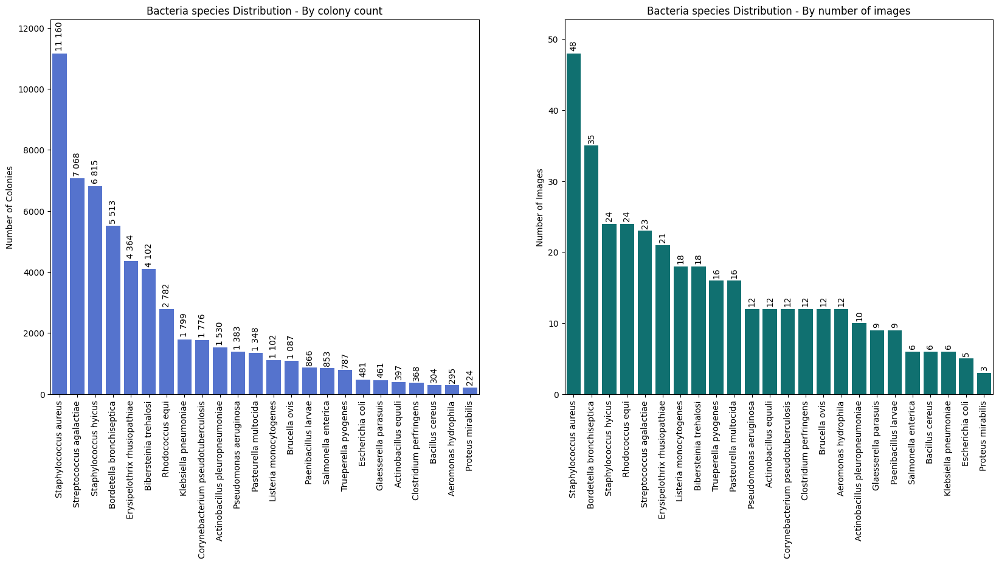

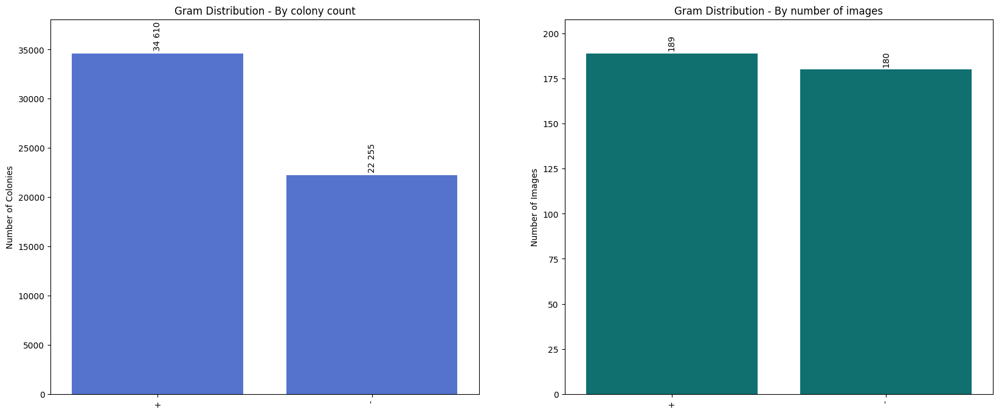

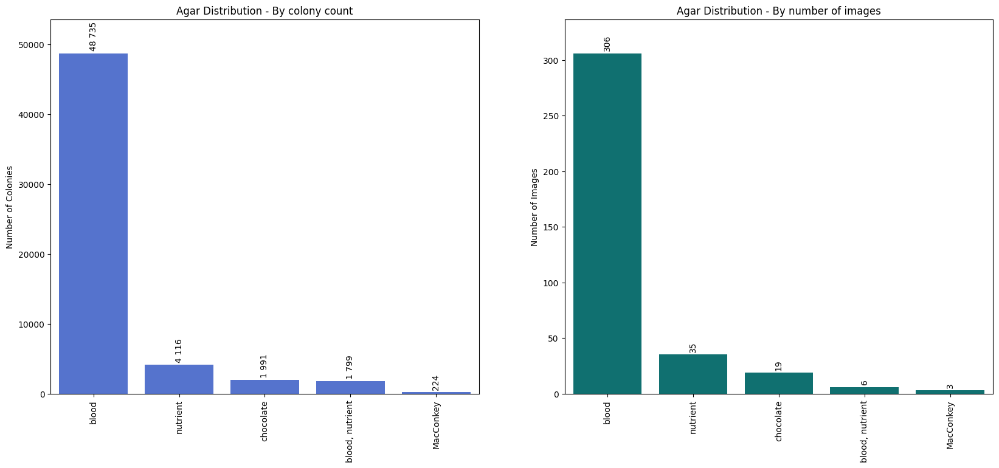

In [41]:
parameters_to_plot = ['Bacteria species', 'Gram', 'Agar']

for i in parameters_to_plot:
    # Set up the subplots
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    # Plot 1: Number of colonies per bacteria species
    sns.countplot(ax=axes[0], x=i, data=df, order=df[i].value_counts().index, color='royalblue')

    # Axes settings for the first plot
    axes[0].set_title(i + ' Distribution - By colony count')
    axes[0].set_ylabel('Number of Colonies')
    axes[0].set_xlabel('')
    axes[0].tick_params(axis='x', rotation=90)
    max_value = max([p.get_height() for p in axes[0].patches])
    axes[0].set_ylim(0, max_value * 1.1)

    # Add value labels on top of bars for the first plot
    for p in axes[0].patches:
        formatted_value = f'{p.get_height():,.0f}'.replace(',', ' ')
        axes[0].annotate(formatted_value, (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='baseline', fontsize=10, color='black', rotation=90, xytext=(0, 5),
                     textcoords='offset points')
        
    # Plot 2: Number of images per bacteria species
    image_counts = df.groupby(i)['image_name'].nunique().reset_index()
    sns.barplot(ax=axes[1], x=i, y='image_name', data=image_counts, 
                order=image_counts.sort_values('image_name', ascending=False)[i], color='teal')
    
    # Axes settings for the second plot
    axes[1].set_title(i + ' Distribution - By number of images')
    axes[1].set_xlabel('')
    axes[1].set_ylabel('Number of Images')
    axes[1].tick_params(axis='x', rotation=90)
    max_value = max([p.get_height() for p in axes[1].patches])
    axes[1].set_ylim(0, max_value * 1.1)

    # Add value labels on top of bars for the second plot
    for p in axes[1].patches:
        axes[1].annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='baseline', fontsize=10, color='black', rotation=90, xytext=(0, 5),
                        textcoords='offset points')

    # Adjust layout for better spacing between plots
    # plt.tight_layout()
    plt.show()


A couple of comments:
- We observe a clear overrepresentation of agar plates using blood culture media. It is highly likely that this does not accurately represent the actual production data of typical pharmaceutical companies. Therefore, we need to be cautious about this point. It is very possible that after training, the imbalance in our dataset will result in a better capability to detect colonies on blood agar compared to other media. Given the scope of this work, we have no choice but to proceed with this in mind. One solution could be to label additional photographs from other classes.
- We have a fairly large number of bacteria, with significant disparities in the amount of data available for each class. As a result, we won't be able to make predictions about the nature of the analyzed bacteria based on this dataset.

# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">4. Yolov5 Model Training</div>

YOLOv5 (You Only Look Once version 5) is a real-time object detection model known for its speed and efficiency. Developed by Ultralytics, it is the fifth version in the YOLO series, which is recognized for its ability to perform detections with a single pass through the neural network, hence the name "You Only Look Once." YOLOv5 offers significant improvements in both speed and accuracy compared to its predecessors, while being lighter and easier to use.

The model is designed to be easy to train and deploy, with native support for PyTorch, making it a popular choice for computer vision tasks like object recognition in images or videos. YOLOv5 is also modular, allowing users to easily adjust model sizes (e.g., YOLOv5s, YOLOv5m, YOLOv5l, YOLOv5x) depending on specific performance and resource requirements.

Moreover, YOLOv5 stands out for its simple API and built-in support for data augmentation and image transformations, which simplify the process of training and fine-tuning the model on various datasets.

### 4.1 Configuration file

In [47]:

# Create a  YOLOv5 config file to set-up the model
data_config = {
    'train': train_image_dir,       # training pictures path
    'val': val_image_dir,           # validation picture path
    'nc': 1,                        # Number of classes - Only 1 because we just want to count colonies
    'names': ['colony']             # Name of classes
}

# Save the data configuration to a YAML file
file_path = data_dir / 'yolo_data.yaml'
with open(str(file_path), 'w') as file:
    yaml.dump(data_config, file)

### 4.2 Training

Training a YOLOv5 model involves several key steps and parameters that need to be carefully tuned to achieve optimal performance. YOLOv5, a state-of-the-art object detection model, is trained on a dataset containing labeled images, where each object is identified with a bounding box and a corresponding class label.

During training, the model iteratively learns to predict the bounding boxes and classes by minimizing the error between its predictions and the ground truth labels. This process is guided by two important parameters: batch size and epochs.

- Batch Size: The batch size determines the number of images processed together in a single forward and backward pass through the network. A larger batch size can stabilize the learning process and lead to faster convergence but requires more memory. Conversely, a smaller batch size might make the training less stable but can be more memory efficient and allow for more frequent updates to the model's weights.

- Epochs: An epoch is defined as one complete cycle through the entire training dataset. The number of epochs indicates how many times the model will see each image in the dataset during training. More epochs generally allow the model to learn more from the data, but too many epochs can lead to overfitting, where the model performs well on the training data but fails to generalize to unseen data.

Throughout training, the model's performance is monitored using metrics such as precision, recall, and mAP (mean Average Precision) to ensure that it is learning effectively. After training, the best model is selected based on its performance on a validation set, and this model is then ready to be used for object detection tasks.

I optimized the batch size and epoch parameters by testing different pairs of values and analyzing the learning curves. To go further, a proper optimization process would be relevant.

In [56]:
# %cd ..
# %cd yolov5

c:\Users\Arnaud\CFU-counter
c:\Users\Arnaud\CFU-counter\yolov5


In [59]:
!python train.py --img 640 --batch 24 --epochs 50 --data C:/Users/Arnaud/CFU-counter/data/yolo_data.yaml --weights yolov5s.pt --project C:/Users/Arnaud/CFU-counter/models --name yolov5_training_adjusted --hyp C:/Users/Arnaud/CFU-counter/data/hyps/hyp.scratch.yaml --optimizer Adam

^C


# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">5. Inference Test</div>

In [190]:
# Charger le modèle YOLOv5 entraîné
model = torch.hub.load('ultralytics/yolov5', 'custom', path='C:/Users/Arnaud/CFU-counter/data/yolo_project/yolov5_training7/weights/best.pt')

Using cache found in C:\Users\Arnaud/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-7-3 Python-3.11.5 torch-2.3.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


## Préparer la nouvelle image

In [240]:
# Chemin vers la nouvelle image
new_image_path = 'C:/Users/Arnaud/CFU-counter/data/images_CFU_new/new.jpg'

# Charger l'image
image = Image.open(new_image_path)

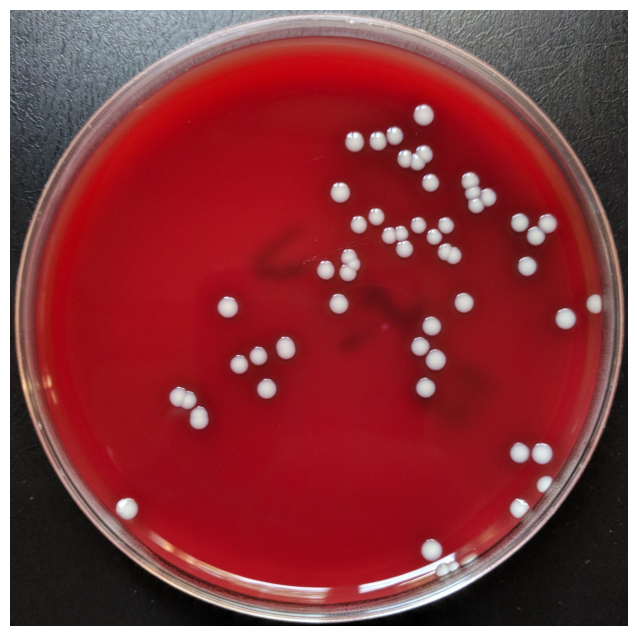

In [241]:
# Afficher l'image*
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.show()

## Effectuer l'inférence et afficher les résultats

In [242]:
# Effectuer l'inférence sur la nouvelle image
results = model(new_image_path)

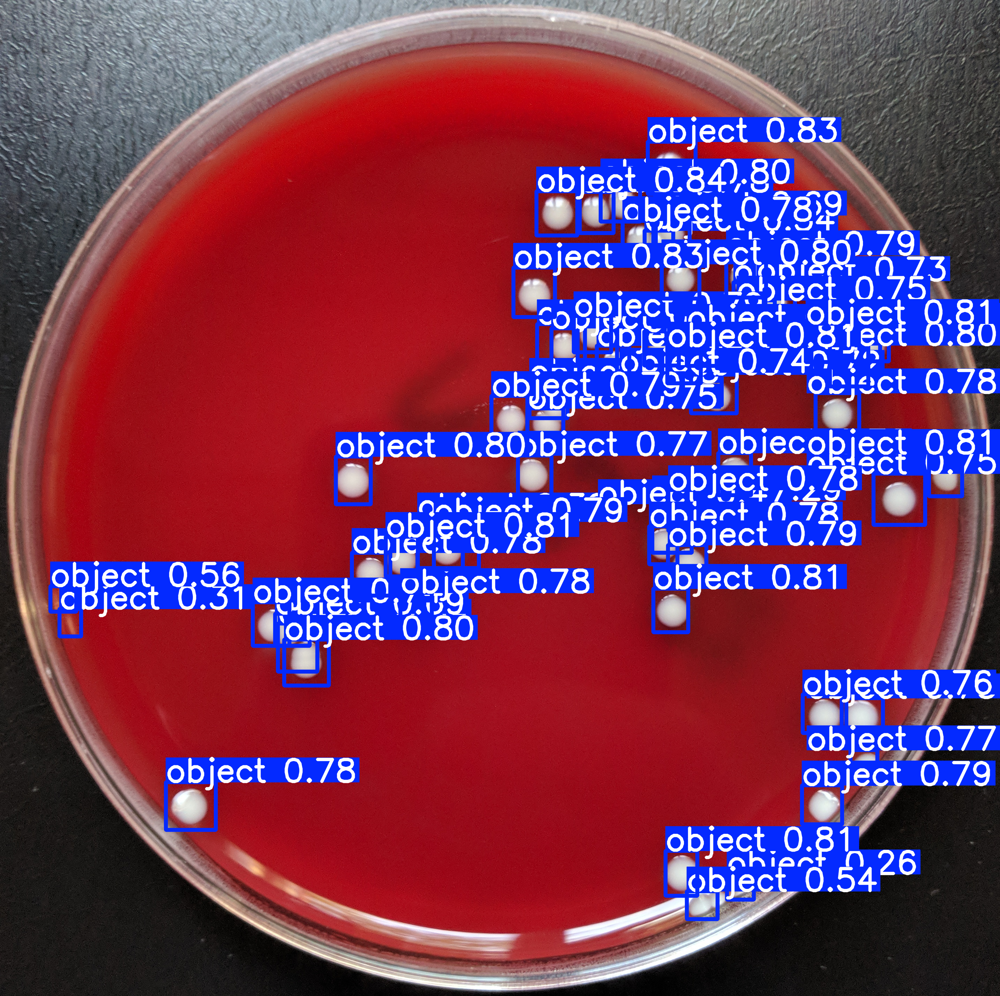

In [243]:
# Afficher les résultats
results.show()

In [244]:
# Si vous souhaitez accéder aux résultats sous forme de données
results_data = results.pandas().xyxy[0]  # Pour obtenir les résultats sous forme de dataframe pandas
for i in ['xmin', 'ymin', 'xmax', 'ymax']:
    results_data[i] = results_data[i].astype(int)
print(results_data)

    xmin  ymin  xmax  ymax  confidence  class    name
0   1537   548  1654   675    0.842399      0  object
1   1856   406  1993   556    0.834677      0  object
2   1471   767  1590   909    0.828166      0  object
3   1105  1539  1197  1653    0.812190      0  object
4   1872  1688  1972  1813    0.811749      0  object
..   ...   ...   ...   ...         ...    ...     ...
57  1196  1483  1372  1629    0.387104      0  object
58   170  1746   232  1825    0.309020      0  object
59  1869  1434  1982  1585    0.287868      0  object
60  1539   929  1676  1063    0.275039      0  object
61  2083  2507  2160  2580    0.257088      0  object

[62 rows x 7 columns]


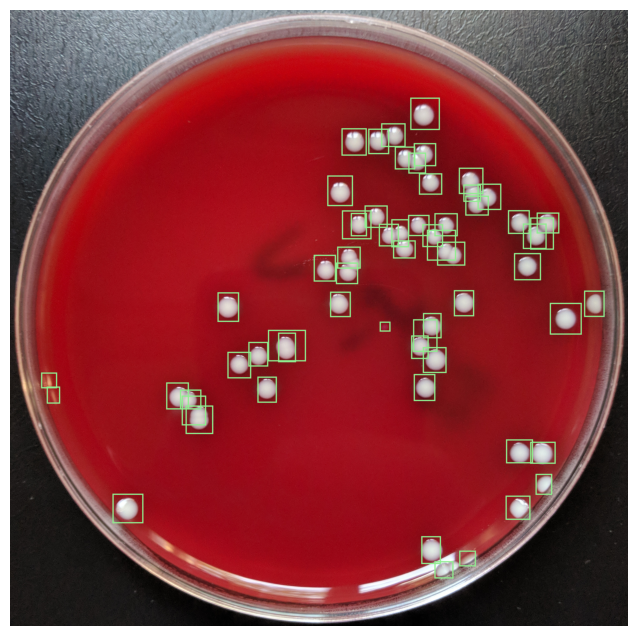

Nombre de colonies identifié : 62 CFU


In [245]:
# Charger l'image
image = Image.open(new_image_path)

# Créer un objet ImageDraw
draw = ImageDraw.Draw(image)

# Dessiner les rectangles pour chaque annotation
for idx, row in results_data.iterrows():
    bbox = [results_data.loc[idx, 'xmin'], results_data.loc[idx, 'ymin'], results_data.loc[idx, 'xmax'], results_data.loc[idx, 'ymax']]
    draw.rectangle(bbox, outline='lightgreen', width=6)
    
# Afficher l'image avec les rectangles
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.show()

print("Nombre de colonies identifié : {} CFU".format(results_data.shape[0]))


# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">Conclusion</div>